Step 1: Data Loading and Preprocessing


To analyze the dataset from kaggle, the first step is setting up API and fetch such dataset to colab environment.

In [1]:
from google.colab import files

# Upload Kaggle API Token
files.upload()

# Set Up Kaggle Environment
import os
import zipfile

# Create the .kaggle directory and move the kaggle.json file there
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Install Kaggle API
!pip install kaggle

# Download and Unzip Dataset
!kaggle datasets download -d asaniczka/1-3m-linkedin-jobs-and-skills-2024

with zipfile.ZipFile("1-3m-linkedin-jobs-and-skills-2024.zip", 'r') as zip_ref:
    zip_ref.extractall(".")


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/asaniczka/1-3m-linkedin-jobs-and-skills-2024
License(s): ODC Attribution License (ODC-By)
1-3m-linkedin-jobs-and-skills-2024.zip: Skipping, found more recently modified local copy (use --force to force download)


Step 2: Spark Environment Setup


**Setting up apache spark environment** in colab notebook, which is the pre step for distributed data processing.

**a**.install java and spark
**b**.set environment variables
**c**.verify installation
**d**.initialize spark session
  **note**, when tring to read such data set in local machine, the spark configuration is very important to get results without overloading local machine.
  In cloud environment, as different tests have shown, it could potentially improve the efficiency of data reading.

In [2]:
# Install Java and Spark
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q https://archive.apache.org/dist/spark/spark-3.1.2/spark-3.1.2-bin-hadoop2.7.tgz
!tar -xvf spark-3.1.2-bin-hadoop2.7.tgz
!pip install -q findspark
!pip install -q pyspark

import os

# Set environment variables
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.1.2-bin-hadoop2.7"

import findspark
findspark.init()

# Verify installation
!echo $JAVA_HOME
!echo $SPARK_HOME
!java -version
!ls $SPARK_HOME




spark-3.1.2-bin-hadoop2.7/
spark-3.1.2-bin-hadoop2.7/R/
spark-3.1.2-bin-hadoop2.7/R/lib/
spark-3.1.2-bin-hadoop2.7/R/lib/sparkr.zip
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/worker/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/worker/worker.R
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/worker/daemon.R
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/tests/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/tests/testthat/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/tests/testthat/test_basic.R
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/profile/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/profile/shell.R
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/profile/general.R
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/R/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/R/SparkR
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/R/SparkR.rdx
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/R/SparkR.rdb
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/Meta/
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/Meta/features.rds
spark-3.1.2-bin-hadoop2.7/R/lib/SparkR/Meta/pac

In [3]:
# Initialize Spark Session
from pyspark.sql import SparkSession

if 'spark' in locals():
    spark.stop()

# Initialize a new Spark session with all necessary configurations
spark = SparkSession.builder \
    .appName("LinkedIn Jobs Analysis") \
    .master("local[4]") \
    .config("spark.executor.memory", "10g") \
    .config("spark.driver.memory", "10g") \
    .config("spark.python.worker.memory", "10g") \
    .config("spark.dynamicAllocation.enabled", "false") \
    .config("spark.executor.extraJavaOptions", "-XX:+UseG1GC") \
    .getOrCreate()

spark

Step 3: Data Preprocessing and Cleaning


For data preprocessing and cleaning, below is a summarized version of codes. Since the data set is not organized as each job description in a unique line, the aggregation of text data is necessary.



In [4]:
# Load the CSV file into a Spark DataFrame
df = spark.read.csv("job_summary.csv", header=True, inferSchema=True).limit(100000)

# Set the configuration
spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

# Set log level (optional)
spark.sparkContext.setLogLevel("INFO")

from pyspark.sql import Window
from pyspark.sql import functions as F

# Flag rows that contain a new job link
df = df.withColumn("is_new_job", F.when(df["job_link"].startswith("http"), F.lit(1)).otherwise(F.lit(0)))

# Window specification to cumulatively sum the 'is_new_job' flags to create a group ID
windowSpec = Window.orderBy(F.monotonically_increasing_id()).rowsBetween(Window.unboundedPreceding, 0)

# Add a 'group_id' column based on the cumulative sum of 'is_new_job' flags
df = df.withColumn("group_id", F.sum("is_new_job").over(windowSpec))

# Group by 'group_id' and aggregate 'job_summary' and collect list of job_links
df_grouped = df.groupBy("group_id").agg(
    F.first("job_link").alias("job_link"),
    F.collect_list("job_summary").alias("job_summaries"),
    F.collect_list("job_link").alias("job_links")
)

# Concatenate all job summaries into a single string per group
df_grouped = df_grouped.withColumn("full_job_description", F.concat_ws(" ", "job_summaries"))

# Remove rows with null values in 'job_link' or 'full_job_description' columns
df_grouped_cleaned = df_grouped.filter(F.col("job_link").isNotNull() & F.col("full_job_description").isNotNull())

# Remove duplicate rows if any
df_grouped_cleaned = df_grouped_cleaned.dropDuplicates()

# Convert Spark DataFrame to a list of job descriptions
job_descriptions = df_grouped_cleaned.select("full_job_description").rdd.flatMap(lambda x: x).collect()


In [5]:
# Show the cleaned grouped DataFrame
df_grouped_cleaned.show()

+--------+--------------------+--------------------+--------------------+--------------------+
|group_id|            job_link|       job_summaries|           job_links|full_job_description|
+--------+--------------------+--------------------+--------------------+--------------------+
|       1|https://www.linke...|[Rock N Roll Sush...|[https://www.link...|Rock N Roll Sushi...|
|       2|https://www.linke...|[Schedule,  frien...|[https://www.link...|Schedule  friends...|
|       3|https://www.linke...|[Description,  of...|[https://www.link...|Description  offe...|
|       4|https://uk.linked...|[Commercial accou...|[https://uk.linke...|Commercial accoun...|
|       5|https://www.linke...|[Address:,  we ar...|[https://www.link...|Address:  we are ...|
|       6|https://www.linke...|[Description,  yo...|[https://www.link...|Description  you’...|
|       7|https://www.linke...|[Company Descript...|[https://www.link...|Company Descripti...|
|       8|https://uk.linked...|[An exciting oppo..

Step 4: Similarity Calculations


In [7]:
%pip install rank_bm25

In [21]:
print(df_grouped_cleaned.columns)


['group_id', 'job_link', 'job_summaries', 'job_links', 'full_job_description']


In [24]:
#download NLTK stopwords

import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [26]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from gensim.models import Word2Vec
from rank_bm25 import BM25Okapi
import re
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

# Define preprocessing function
def preprocess_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer

    text = text.lower()
    text = re.sub(f"[{re.escape(string.punctuation)}]", "", text)
    words = text.split()
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    return " ".join(words)

# Register UDF
preprocess_text_udf = udf(preprocess_text, StringType())

# Apply UDF to create a new column
df_grouped_cleaned = df_grouped_cleaned.withColumn("cleaned_description", preprocess_text_udf("full_job_description"))

# Show the resulting DataFrame
df_grouped_cleaned.show(truncate=False)

# Convert Spark DataFrame to Pandas DataFrame for further processing
df_pandas = df_grouped_cleaned.toPandas()
job_descriptions = df_pandas['cleaned_description'].tolist()

# TF-IDF Vectorization and Similarity Calculations
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(job_descriptions)
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)
max_distance = np.max(euclidean_distances(tfidf_matrix, tfidf_matrix))
euclidean_sim = max_distance - euclidean_distances(tfidf_matrix, tfidf_matrix)

# Word2Vec Embeddings
sentences = [desc.split() for desc in job_descriptions]
w2v_model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)

def average_word_vectors(words, model, vocabulary, num_features):
    feature_vector = np.zeros((num_features,), dtype="float32")
    n_words = 0
    for word in words:
        if word in vocabulary:
            n_words += 1
            feature_vector = np.add(feature_vector, model.wv[word])
    if n_words > 0:
        feature_vector = np.divide(feature_vector, n_words)
    return feature_vector

job_vectors = np.array([average_word_vectors(desc.split(), w2v_model, w2v_model.wv.key_to_index, 100) for desc in job_descriptions])
cosine_sim_w2v = cosine_similarity(job_vectors, job_vectors)

# BM25 Similarity
tokenized_corpus = [doc.split() for doc in job_descriptions]
bm25 = BM25Okapi(tokenized_corpus)
bm25_scores = [bm25.get_scores(job) for job in tokenized_corpus]
bm25_similarity = np.array(bm25_scores)

# Display Similarity Matrices
print("Cosine Similarity (TF-IDF):")
print(cosine_sim)

print("\nEuclidean Similarity (TF-IDF):")
print(euclidean_sim)

print("\nCosine Similarity (Word2Vec):")
print(cosine_sim_w2v)

print("\nBM25 Similarity:")
print(bm25_similarity)

+--------+-------------------------------------------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Step 5: Clustering and Analysis Functions


In [27]:
# Clustering Functions
def cluster_similar_items(similarity_matrix, threshold=0.5):
    clusters = defaultdict(list)
    visited = set()
    cluster_id = 0

    for i in range(similarity_matrix.shape[0]):
        if i not in visited:
            clusters[cluster_id].append(i)
            visited.add(i)
            for j in range(i+1, similarity_matrix.shape[0]):
                if similarity_matrix[i][j] > threshold:
                    clusters[cluster_id].append(j)
                    visited.add(j)
            cluster_id += 1

    return clusters

def print_top_clusters(clusters, job_descriptions, top_n=3):
    sorted_clusters = sorted(clusters.items(), key=lambda x: len(x[1]), reverse=True)
    for i in range(min(top_n, len(sorted_clusters))):
        cluster_id, indices = sorted_clusters[i]
        print(f"Cluster {i+1} (Size: {len(indices)}):")
        for idx in indices:
            print(f"- {job_descriptions[idx][:100]}...")  # Print first 100 chars of each description for brevity
        print()

Step 6: Visualization Functions


In [28]:
# Visualize Clusters
def visualize_clusters(clusters, similarity_matrix, job_descriptions, top_n=3):
    sorted_clusters = sorted(clusters.items(), key=lambda x: len(x[1]), reverse=True)
    for i in range(min(top_n, len(sorted_clusters))):
        cluster_id, indices = sorted_clusters[i]
        G = nx.Graph()
        for idx in indices:
            G.add_node(idx, label=job_descriptions[idx][:30])
        for j in indices:
            for k in indices:
                if j != k and similarity_matrix[j][k] > 0.5:
                    G.add_edge(j, k, weight=similarity_matrix[j][k])
        pos = nx.spring_layout(G, k=0.15, iterations=20)
        plt.figure(figsize=(12, 12))
        nx.draw(G, pos, with_labels=True, node_size=50, font_size=8)
        plt.title(f"Cluster {i+1} Visualization")
        plt.show()

Step 7: Results and Heatmap Visualization


Streaming output truncated to the last 5000 lines.
- value start people join team value 000 store experience equity inclusion ca train develops leadershi...
- grow revenue developer relation group software engineer focused internal advocacy coach partnership ...
- value start people join team value 000 store experience equity inclusion ca train develops leadershi...
- description you’ll work closely restaurant manager ensuring operating procedure followed you’ll also...
- dollar general corporation delivering value shopper 80 year dollar general help shopper save time sa...
- dollar general corporation delivering value shopper 80 year dollar general help shopper save time sa...
- reward benefit offer hour 0900 1900 though 8hour shift 0900 1300 warm wellestablished employer state...
- join chic team dedicated styling social experience inspires woman express individuality including ma...
- intimissimi beyond function renowned exquisite craftsmanship intimissimi dedicated delivering excep

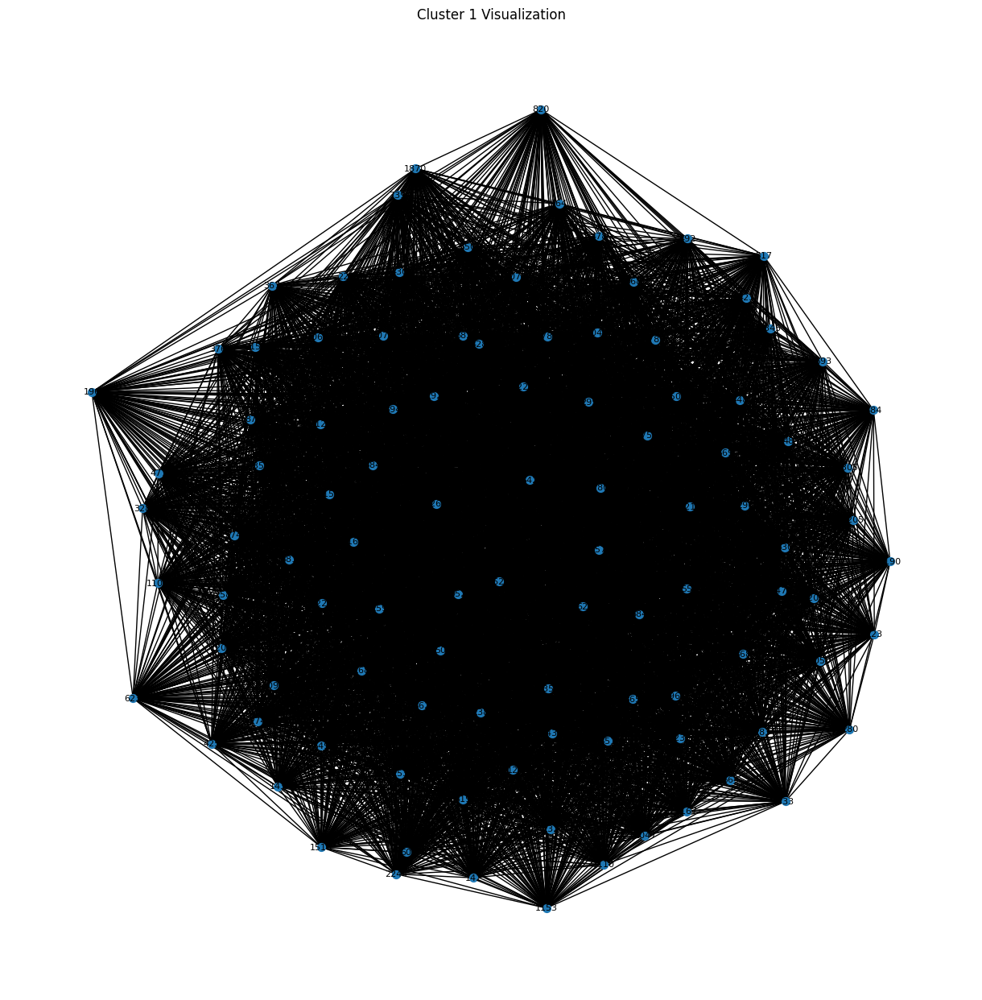

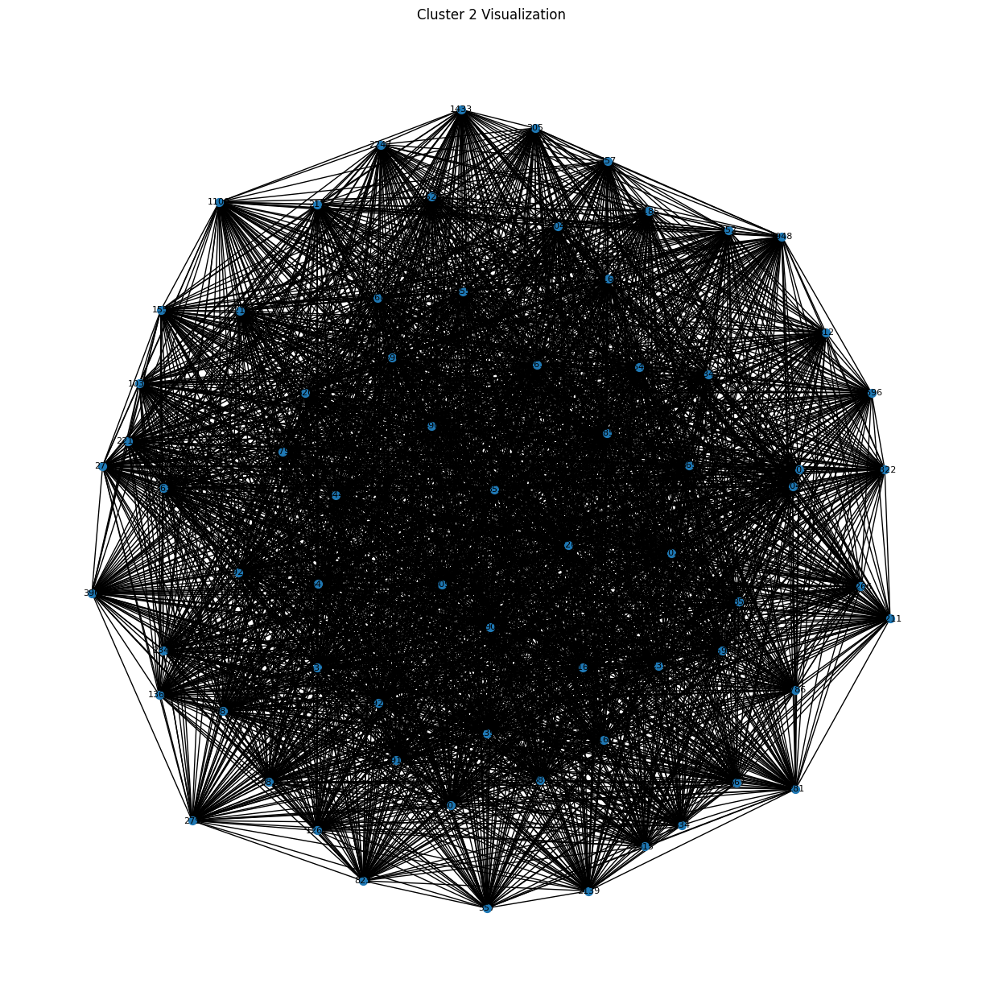

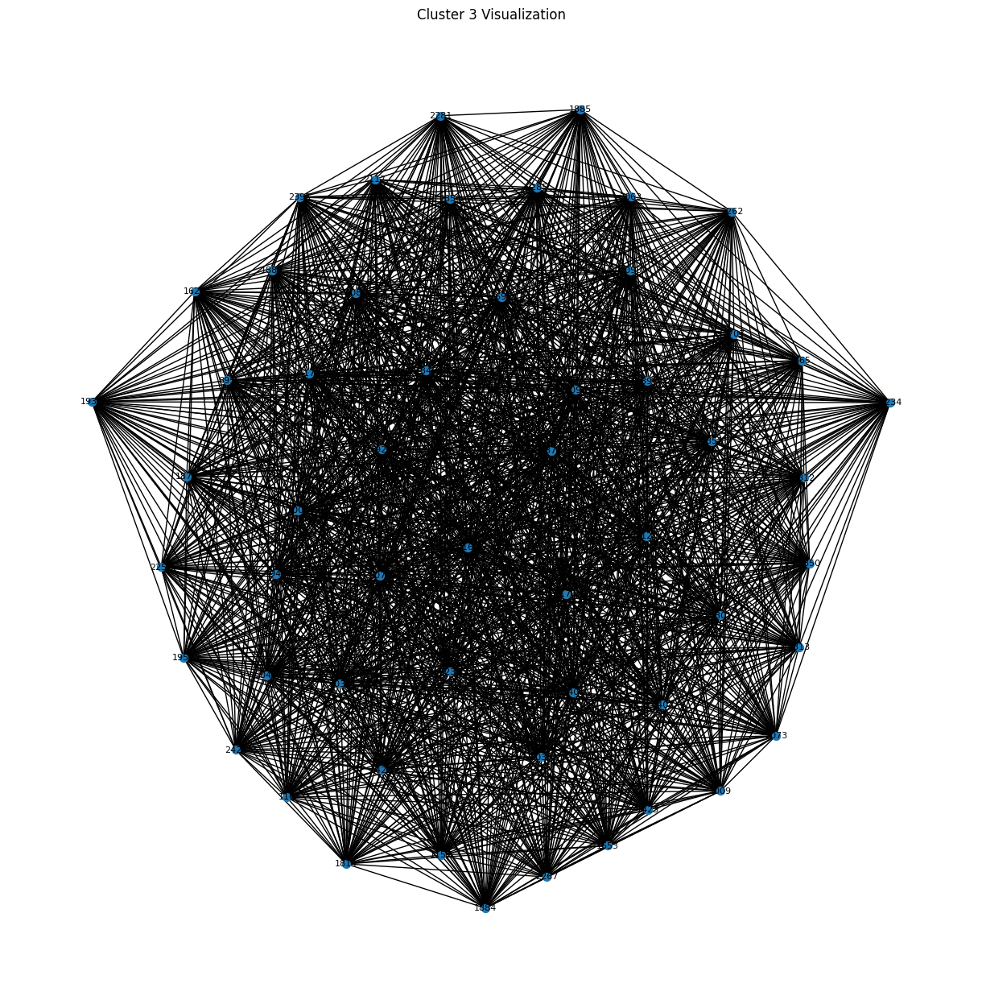

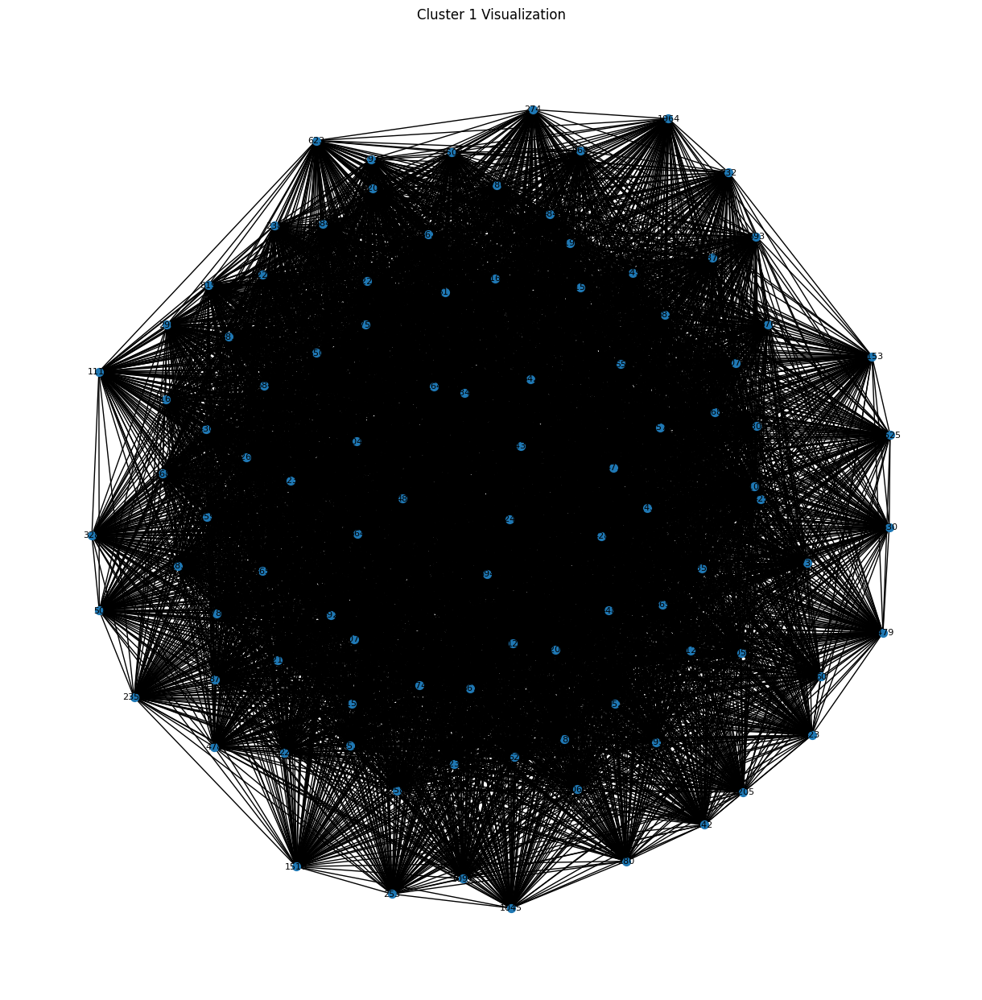

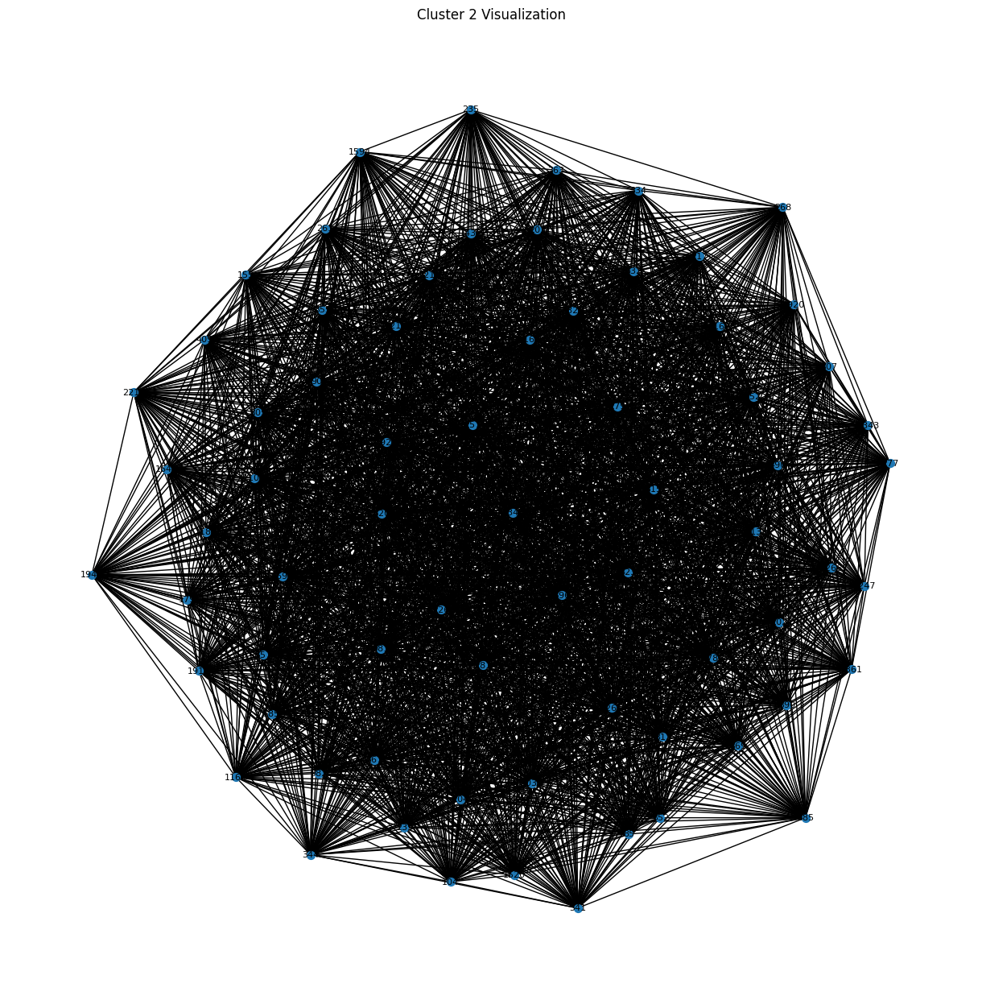

...

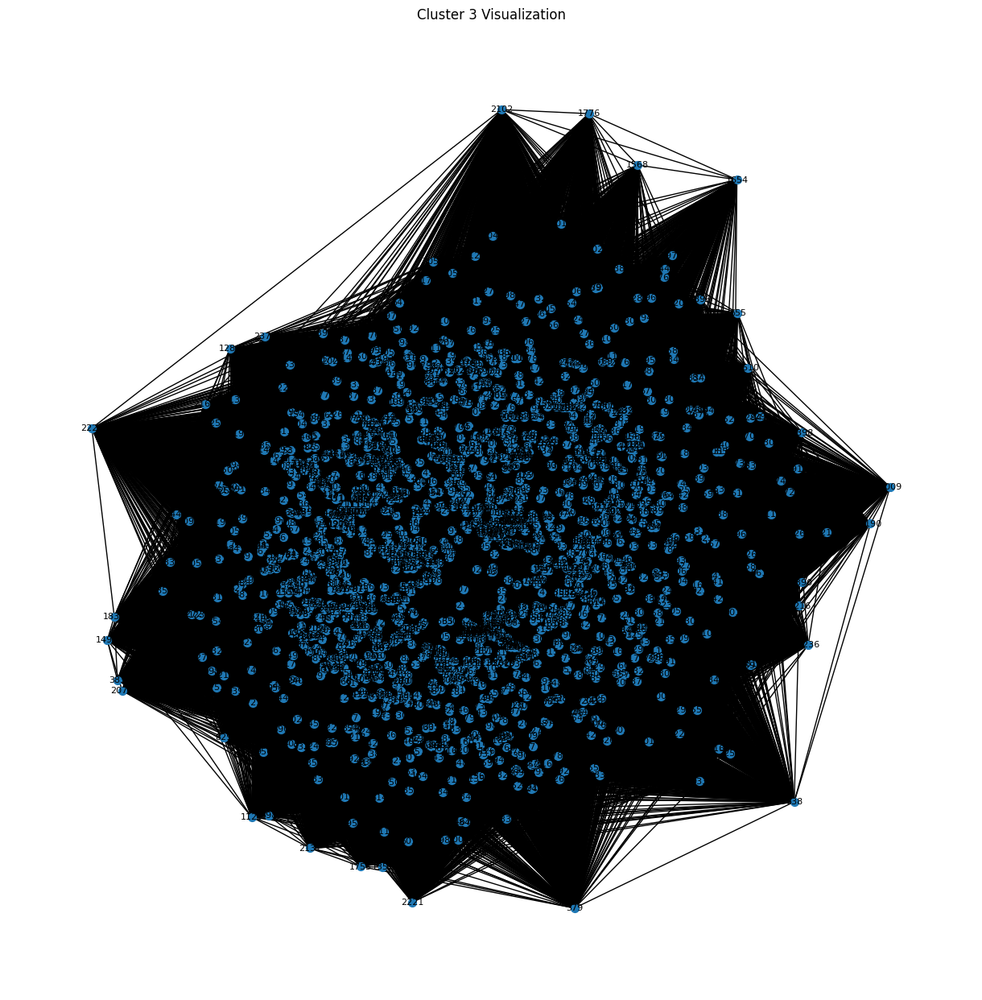

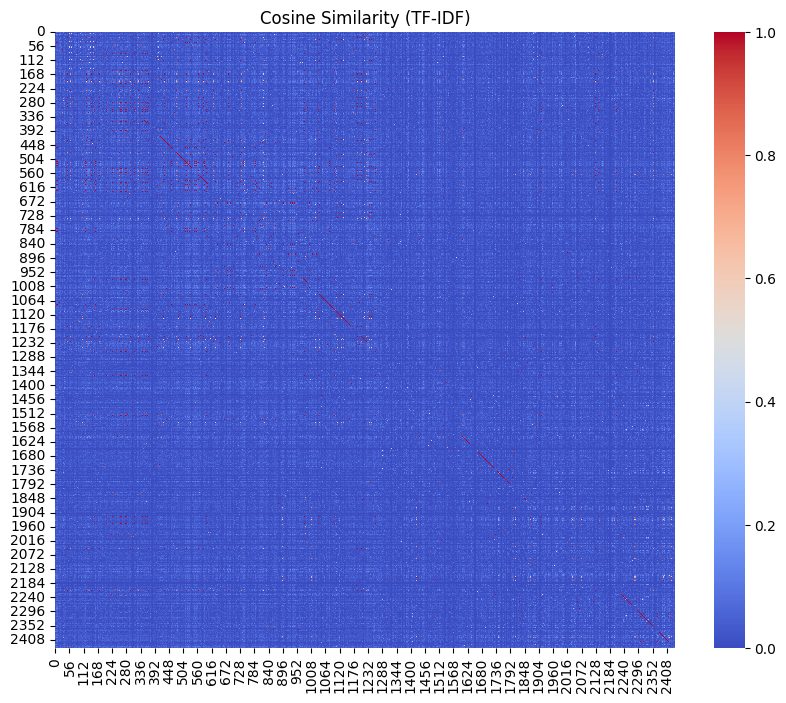

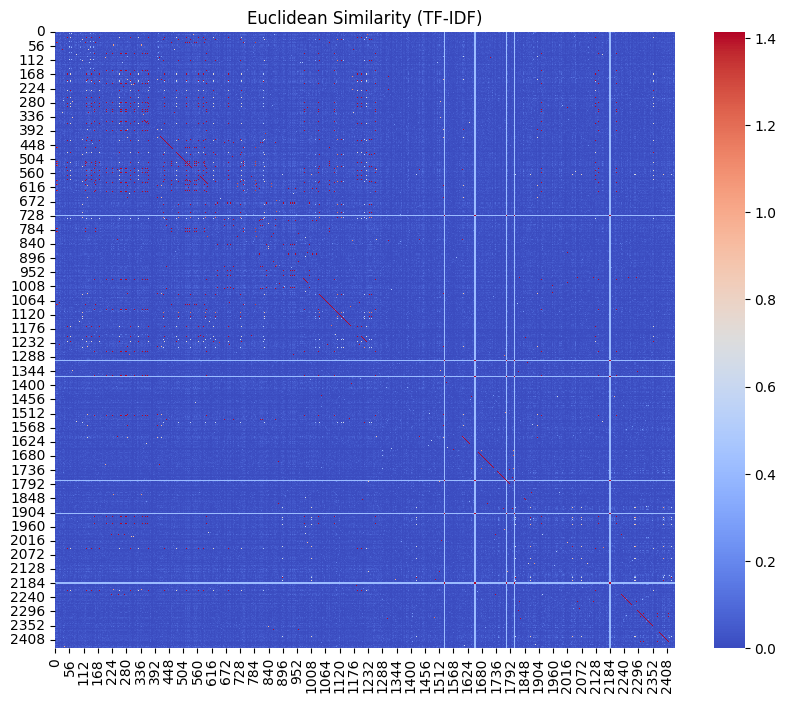

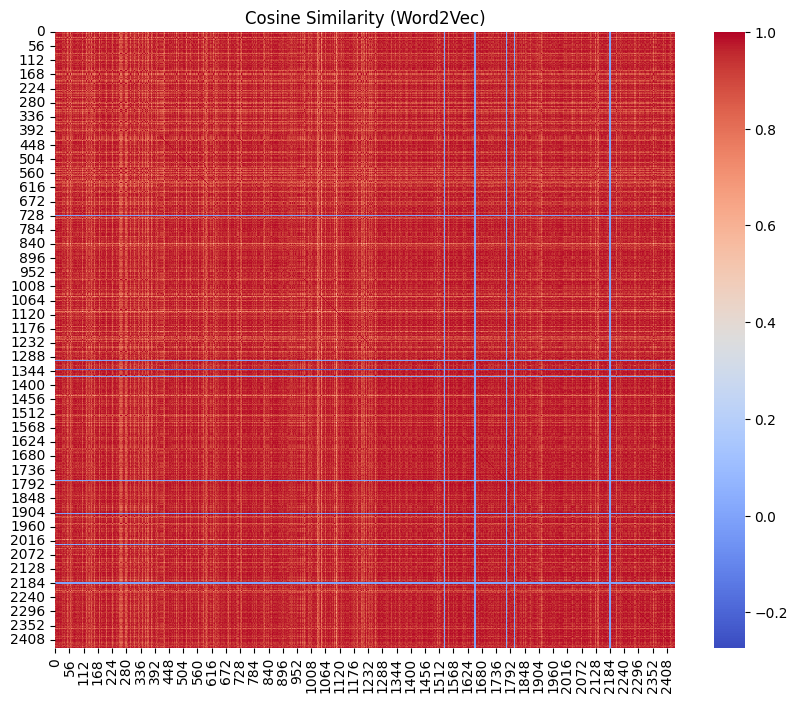

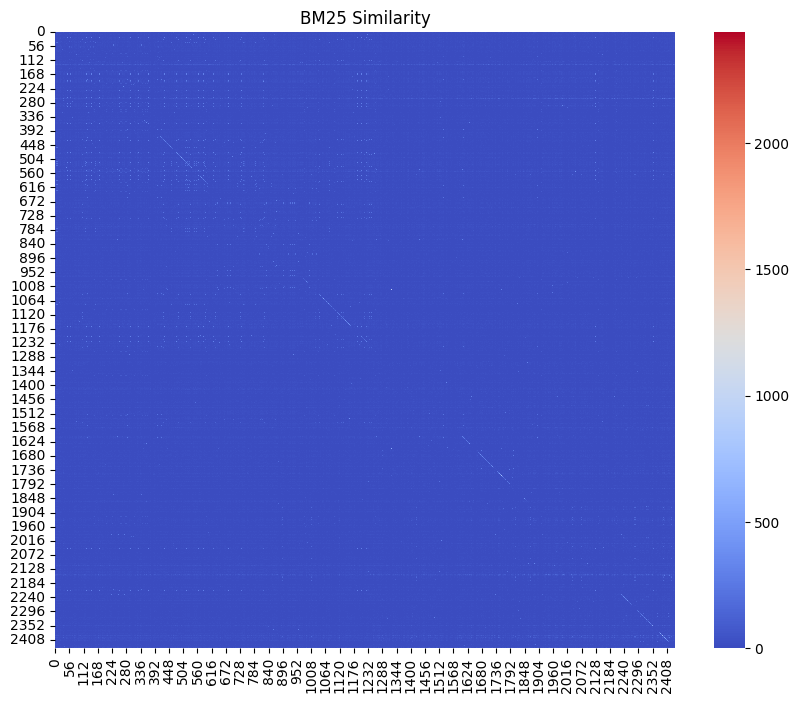

In [29]:
# Heatmap Visualization
def plot_heatmap(matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix, cmap='coolwarm', annot=False)
    plt.title(title)
    plt.show()

# Clustering and Printing Top 3 Clusters for Each Similarity Method
cosine_clusters = cluster_similar_items(cosine_sim, threshold=0.5)
print("Top 3 Clusters for Cosine Similarity (TF-IDF):")
print_top_clusters(cosine_clusters, job_descriptions)

euclidean_clusters = cluster_similar_items(euclidean_sim, threshold=0.5 * max_distance)
print("Top 3 Clusters for Euclidean Similarity (TF-IDF):")
print_top_clusters(euclidean_clusters, job_descriptions)

w2v_clusters = cluster_similar_items(cosine_sim_w2v, threshold=0.5)
print("Top 3 Clusters for Cosine Similarity (Word2Vec):")
print_top_clusters(w2v_clusters, job_descriptions)

bm25_clusters = cluster_similar_items(bm25_similarity, threshold=0.5)
print("Top 3 Clusters for BM25 Similarity:")
print_top_clusters(bm25_clusters, job_descriptions)

# Visualize Top 3 Clusters for Each Similarity Method
visualize_clusters(cosine_clusters, cosine_sim, job_descriptions, top_n=3)
visualize_clusters(euclidean_clusters, euclidean_sim, job_descriptions, top_n=3)
visualize_clusters(w2v_clusters, cosine_sim_w2v, job_descriptions, top_n=3)
visualize_clusters(bm25_clusters, bm25_similarity, job_descriptions, top_n=3)

# Plot Heatmaps for Different Similarity Measures
plot_heatmap(cosine_sim, "Cosine Similarity (TF-IDF)")
plot_heatmap(euclidean_sim, "Euclidean Similarity (TF-IDF)")
plot_heatmap(cosine_sim_w2v, "Cosine Similarity (Word2Vec)")
plot_heatmap(bm25_similarity, "BM25 Similarity")

Print samples randomly choose 10 pairs of similar jobs of each type

In [34]:
import numpy as np

def get_top_similar_pairs(similarity_matrix, job_descriptions, top_n=3):
    """
    Get top N pairs of similar jobs based on the similarity matrix.

    Args:
    similarity_matrix (numpy.ndarray): The similarity matrix.
    job_descriptions (list): List of job descriptions.
    top_n (int): Number of top similar pairs to return.

    Returns:
    list: List of tuples containing pairs of similar job descriptions and their similarity scores.
    """
    # Create a list to hold the top pairs
    top_pairs = []

    # Get the indices of the top N similar pairs
    indices = np.dstack(np.unravel_index(np.argsort(-similarity_matrix.ravel()), similarity_matrix.shape))[0]

    for index in indices:
        i, j = index
        if i != j:
            top_pairs.append((job_descriptions[i], job_descriptions[j], similarity_matrix[i, j]))
        if len(top_pairs) >= top_n:
            break

    return top_pairs

def print_top_pairs(pairs, method_name):
    """
    Print the top similar pairs of jobs.

    Args:
    pairs (list): List of tuples containing pairs of similar job descriptions and their similarity scores.
    method_name (str): Name of the similarity method.
    """
    print(f"\nTop {len(pairs)} Similar Job Pairs ({method_name}):")
    for i, (job1, job2, score) in enumerate(pairs):
        print(f"\nPair {i+1}:")
        print(f"Job 1: {job1}")
        print(f"Job 2: {job2}")
        print(f"Similarity Score: {score:.4f}")

# Get and print top similar pairs for each method

# Cosine Similarity (TF-IDF)
cosine_pairs = get_top_similar_pairs(cosine_sim, job_descriptions, top_n=3)
print_top_pairs(cosine_pairs, "Cosine Similarity (TF-IDF)")

# Euclidean Similarity (TF-IDF)
euclidean_pairs = get_top_similar_pairs(euclidean_sim, job_descriptions, top_n=3)
print_top_pairs(euclidean_pairs, "Euclidean Similarity (TF-IDF)")

# Cosine Similarity (Word2Vec)
w2v_pairs = get_top_similar_pairs(cosine_sim_w2v, job_descriptions, top_n=3)
print_top_pairs(w2v_pairs, "Cosine Similarity (Word2Vec)")

# BM25 Similarity
bm25_pairs = get_top_similar_pairs(bm25_similarity, job_descriptions, top_n=3)
print_top_pairs(bm25_pairs, "BM25 Similarity")



Top 3 Similar Job Pairs (Cosine Similarity (TF-IDF)):

Pair 1:
Job 1: Fun. Flexible hours. Great pay. Fantastic people. Professional fulfillment. That uniquely cool  safe and enjoyable work environment so they may realize their greatest potential.  safe and efficient manner.  assistant manager  nights  reading and computer skills  train  policies and practices  classic cars and vintage threads may be things of the past  so APPLY TODAY!  quick service restaurant concept that has growth opportunities for managers in a fast casual dining restaurant company. At SONIC you can grow your career with us.  you will manage restaurant teams along with assistant manager roles and duties working as a member of the restaurant management (RM) team. Roles are similar to a QSR key team leaders / keyholders. This includes shift supervisory / shift lead roles ensuring high quality food is prepared and served to our customers.
Job 2: Fun. Flexible hours. Great pay. Fantastic people. Professional fulfillm